<a href="https://colab.research.google.com/github/sriya-singh/Music-Recommendation-System/blob/main/Spotify_Music_Recommendation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import numpy as np
import pandas as pd

import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist

import warnings
warnings.filterwarnings("ignore")

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/Spotify data/data.csv')
genre_data = pd.read_csv('/content/drive/MyDrive/Spotify data/data_by_genres.csv')
year_data = pd.read_csv('/content/drive/MyDrive/Spotify data/data_by_year.csv')
artist_data = pd.read_csv('/content/drive/MyDrive/Spotify data/data_by_artist.csv')

In [ ]:
print(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 170653 entries, 0 to 170652
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   valence           170653 non-null  float64
 1   year              170653 non-null  int64  
 2   acousticness      170653 non-null  float64
 3   artists           170653 non-null  object 
 4   danceability      170653 non-null  float64
 5   duration_ms       170653 non-null  int64  
 6   energy            170653 non-null  float64
 7   explicit          170653 non-null  int64  
 8   id                170653 non-null  object 
 9   instrumentalness  170653 non-null  float64
 10  key               170653 non-null  int64  
 11  liveness          170653 non-null  float64
 12  loudness          170653 non-null  float64
 13  mode              170653 non-null  int64  
 14  name              170653 non-null  object 
 15  popularity        170653 non-null  int64  
 16  release_date      17

In [ ]:
print(genre_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2973 entries, 0 to 2972
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              2973 non-null   int64  
 1   genres            2973 non-null   object 
 2   acousticness      2973 non-null   float64
 3   danceability      2973 non-null   float64
 4   duration_ms       2973 non-null   float64
 5   energy            2973 non-null   float64
 6   instrumentalness  2973 non-null   float64
 7   liveness          2973 non-null   float64
 8   loudness          2973 non-null   float64
 9   speechiness       2973 non-null   float64
 10  tempo             2973 non-null   float64
 11  valence           2973 non-null   float64
 12  popularity        2973 non-null   float64
 13  key               2973 non-null   int64  
dtypes: float64(11), int64(2), object(1)
memory usage: 325.3+ KB
None


In [ ]:
print(year_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 14 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              100 non-null    int64  
 1   year              100 non-null    int64  
 2   acousticness      100 non-null    float64
 3   danceability      100 non-null    float64
 4   duration_ms       100 non-null    float64
 5   energy            100 non-null    float64
 6   instrumentalness  100 non-null    float64
 7   liveness          100 non-null    float64
 8   loudness          100 non-null    float64
 9   speechiness       100 non-null    float64
 10  tempo             100 non-null    float64
 11  valence           100 non-null    float64
 12  popularity        100 non-null    float64
 13  key               100 non-null    int64  
dtypes: float64(11), int64(3)
memory usage: 11.1 KB
None


In [ ]:
print(artist_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28680 entries, 0 to 28679
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   mode              28680 non-null  int64  
 1   count             28680 non-null  int64  
 2   acousticness      28680 non-null  float64
 3   artists           28680 non-null  object 
 4   danceability      28680 non-null  float64
 5   duration_ms       28680 non-null  float64
 6   energy            28680 non-null  float64
 7   instrumentalness  28680 non-null  float64
 8   liveness          28680 non-null  float64
 9   loudness          28680 non-null  float64
 10  speechiness       28680 non-null  float64
 11  tempo             28680 non-null  float64
 12  valence           28680 non-null  float64
 13  popularity        28680 non-null  float64
 14  key               28680 non-null  int64  
dtypes: float64(11), int64(3), object(1)
memory usage: 3.3+ MB
None




---



Using the FeatureCorrelation visualizer to analyze the correlation between the features listed in feature_names and the target variable popularity.

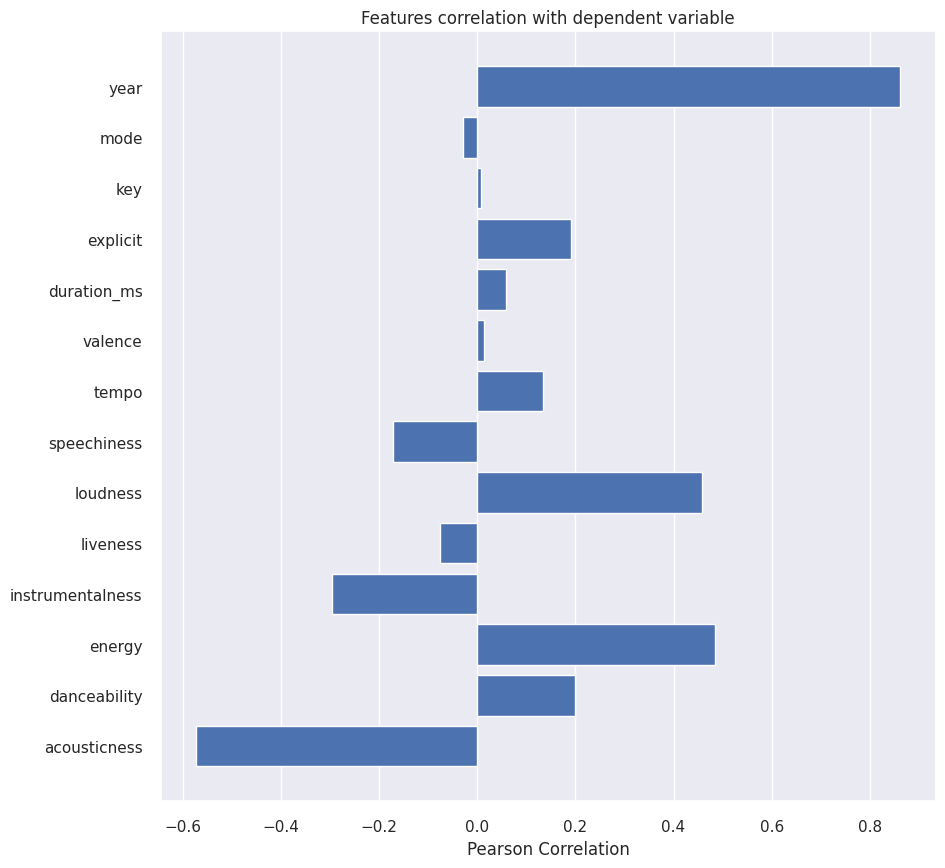

<Axes: title={'center': 'Features correlation with dependent variable'}, xlabel='Pearson Correlation'>

In [ ]:
from yellowbrick.target import FeatureCorrelation

feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence','duration_ms','explicit','key','mode','year']

X, y = data[feature_names], data['popularity']

# Create a list of the feature names
features = np.array(feature_names)

# Instantiate the visualizer
visualizer = FeatureCorrelation(labels=features)

plt.rcParams['figure.figsize']=(10,10)
visualizer.fit(X, y)     # Fit the data to the visualizer
visualizer.show()

From this graph we can clearly see that,
mode, key, duration_ms, valence, liveness are weakly correlated to
popularity.



---


# Exploratory Data Analysis

### Count of songs by Decade

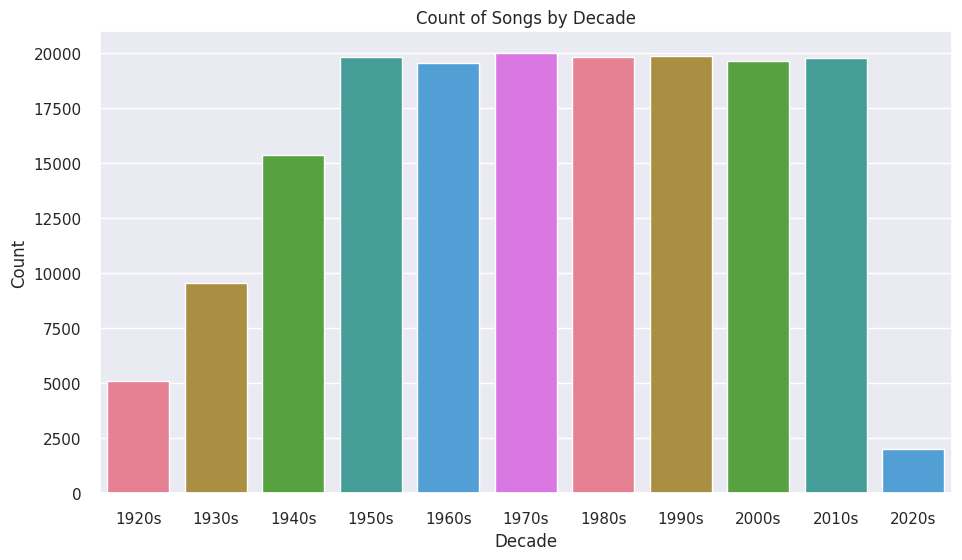

In [ ]:
def get_decade(year):
    period_start = int(year/10) * 10
    decade = '{}s'.format(period_start)
    return decade

data['decade'] = data['year'].apply(get_decade)

sns.set(rc={'figure.figsize':(11 ,6)})

colors = sns.color_palette('husl')

sns.countplot(x=data['decade'], palette=colors)

plt.xlabel('Decade')
plt.ylabel('Count')
plt.title('Count of Songs by Decade')

# plt.xticks(rotation=45)

plt.show()


### Sound features over decades

In [ ]:
sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']
fig = px.line(year_data, x='year', y=sound_features)
fig.show()

### Trend of loudness over decades

In [ ]:
fig = px.line(year_data, x='year', y='loudness',title='Trend of loudness over decades')
fig.show()

### Features of top 10 genres

In [ ]:
top10_genres = genre_data.nlargest(10, 'popularity')

fig = px.bar(top10_genres, x='genres', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group')
fig.show()

### Genres Wordcloud

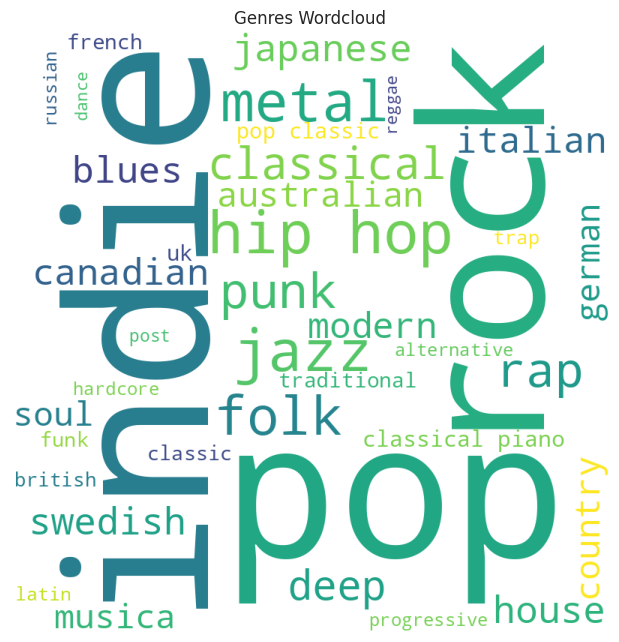

In [ ]:
from wordcloud import WordCloud,STOPWORDS

stopwords = set(STOPWORDS)
comment_words = " ".join(genre_data['genres'])+" "
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                max_words=40,
                min_font_size = 10).generate(comment_words)

plt.figure(figsize = (6, 6), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)
plt.title("Genres Wordcloud")
plt.show()

### Artists Wordcloud

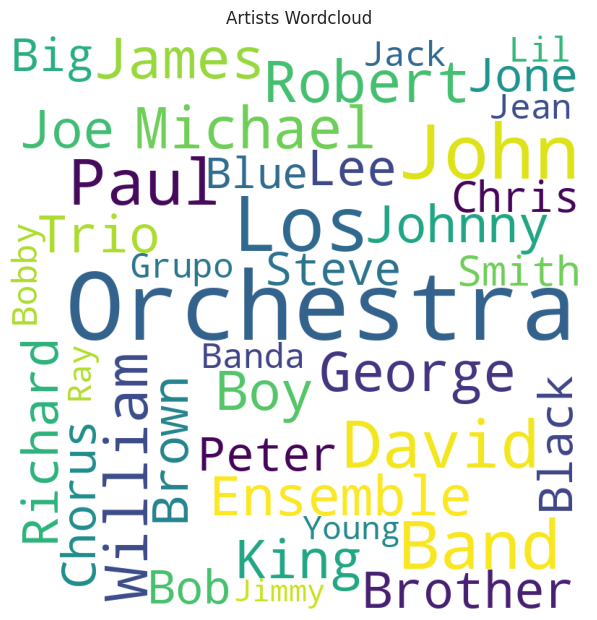

In [ ]:
stopwords = set(STOPWORDS)
comment_words = " ".join(artist_data['artists'])+" "
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_word_length=3,
                max_words=40,
                min_font_size = 10).generate(comment_words)

plt.figure(figsize = (6, 6), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.title("Artists Wordcloud")
plt.tight_layout(pad = 0)
plt.show()

### Top 10 popular artists

In [ ]:
top10_popular_artists = artist_data.nlargest(10, 'popularity')
print('Top 10 Artists that had most popularity score:')
top10_popular_artists[['popularity','artists']].sort_values('popularity',ascending=False)

Top 10 Artists that had most popularity score:


,popularity,artists
20966,93.0,Ritt Momney
14354,92.0,Lele Pons
15070,90.0,Los Legendarios
11764,89.0,Jerry Di
7463,88.0,Emilee
23687,88.0,Surf Mesa
28263,88.0,salem ilese
213,87.0,A7S
2343,86.0,Beltito
14378,86.0,Lenny Santos




---


# Clustering Genres by K-Means

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

# Create a pipeline with two steps: scaling and clustering
cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10))])
X = genre_data.select_dtypes(np.number) # select numeric features from genre_data
cluster_pipeline.fit(X)
genre_data['cluster'] = cluster_pipeline.predict(X) # assigning each data point in 'X' to a cluster


t-SNE excels at preserving local structures and capturing non-linear relationships. In the context of genres, it helps reveal how closely related genres cluster together in a visually interpretable way.

In [ ]:
# Visualizing the Clusters with t-SNE

from sklearn.manifold import TSNE

# Create a pipeline with two steps: scaling and tsne to reduce the data to 2 dimensions (x and y)
tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genre_embedding = tsne_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.004s...
[t-SNE] Computed neighbors for 2973 samples in 0.349s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.106216
[t-SNE] KL divergence after 1000 iterations: 1.393966


# Clustering Songs by K-Means

In [ ]:
# Create a pipeline with two steps: scaling and clustering
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=20, verbose=False))], verbose=False)
X = data.select_dtypes(np.number) # select numeric features from genre_data
number_cols = list(X.columns)
song_cluster_pipeline.fit(X)
song_cluster_labels = song_cluster_pipeline.predict(X) # assigning each data point in 'X' to a cluster
data['cluster_label'] = song_cluster_labels

Songs may be characterized by a set of features that have linear relationships or global structures. For example, certain features may contribute more significantly to the overall "style" or characteristics of a song. Hence, PCA is effective at capturing linear relationships and preserving global structures by identifying the principal components that explain the most variance in the data.

In [ ]:
# Visualizing the Clusters with PCA

from sklearn.decomposition import PCA

# Create a pipeline with two steps: scaling and PCA to reduce the data to 2 dimensions (x and y)
pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()



---


# Building Recommendation System



*   Based on the analysis and visualizations, it is clear that similar genres tend to have data points that are located close to each other while similar types of songs are also clustered together.
*   This observation makes perfect sense. Similar genres will sound similar and will come from similar time periods while the same can be said for songs within those genres. We can use this idea to build a recommendation system by taking the data points of the songs a user has listened to and recommending songs corresponding to nearby data points.

In [ ]:
!pip install spotipy



*   Spotipy is a Python client for the Spotify Web API that makes it easy for developers to fetch data and query Spotify's catalog for songs. You have to install using pip install spotipy
*   After installing Spotipy, you will need to create an app on the Spotify Developer's page and save your Client ID and secret key.







In [ ]:
import os

# Set Spotify API credentials as environment variables
os.environ["SPOTIFY_CLIENT_ID"] = "bc707fc1e55a4b11919cf4f2f9376d1a"
os.environ["SPOTIFY_CLIENT_SECRET"] = "0f27b7f9d1d14f58a20a802cb0ced2bd"


In [ ]:
import spotipy # Python library for interacting with the Spotify Web API.
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id=os.environ["SPOTIFY_CLIENT_ID"],
                                                           client_secret=os.environ["SPOTIFY_CLIENT_SECRET"]))


# Function to get all the details and audio features of the song (if found) from spotify API
def find_song(name, year):
    song_data = defaultdict()
    results = sp.search(q= 'track: {} year: {}'.format(name,year), limit=1) # search song in spotify using spotify API
    if results['tracks']['items'] == []:
        return None

    results = results['tracks']['items'][0]      # extract info about the song
    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]

    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]

    for key, value in audio_features.items():
        song_data[key] = value

    return pd.DataFrame(song_data)

In [ ]:
from collections import defaultdict
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
import difflib

number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']


def get_song_data(song, spotify_data):

    try:
        song_data = spotify_data[(spotify_data['name'] == song['name'])            # return song_data if it is present in the given dataset
                                & (spotify_data['year'] == song['year'])].iloc[0]
        return song_data

    except IndexError:
        return find_song(song['name'], song['year'])  # use API if song was not found in the given dataset


# get mean vector of all the features in number_col for the given song_list
def get_mean_vector(song_list, spotify_data):

    song_vectors = []

    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in database'.format(song['name']))
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)

    song_matrix = np.array(list(song_vectors))
    return np.mean(song_matrix, axis=0)


def flatten_dict_list(dict_list):

    flattened_dict = defaultdict()
    for key in dict_list[0].keys():
        flattened_dict[key] = []   # name of all the features

    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)

    return flattened_dict


def recommend_songs( song_list, spotify_data, n_songs=10):

    metadata_cols = ['name', 'year', 'artists']
    song_dict = flatten_dict_list(song_list)

    song_center = get_mean_vector(song_list, spotify_data)  # get mean of the features of all the songs in song_list
    scaler = song_cluster_pipeline.steps[0][1]                  # obtaining the scaler used in song_cluster_pipeline
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
    # The resulting distances array will contain the cosine distances between the scaled_song_center and each data point in scaled_data.
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    # the index variable contains a list of indices corresponding to the n_songs closest songs in your Spotify data to the mean vector of your input songs.
    index = list(np.argsort(distances)[:, :n_songs][0])

    rec_songs = spotify_data.iloc[index] # uses the retrieved index to select the corresponding rows (songs) from your spotify_data DataFrame.
    # checks whether the 'name' column of each song in rec_songs is not present in the 'name' column of songs in song_dict.
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]

    return pd.DataFrame(rec_songs[metadata_cols]).reset_index(drop=True)

In [ ]:
recommend_songs([{'name': 'lean on', 'year':2015}, {'name': 'let me love you', 'year':2016}],  data)

,name,year,artists
0,"Baby, I'm Jealous (feat. Doja Cat)",2020,"['Bebe Rexha', 'Doja Cat']"
1,Mama Said,2016,['Lukas Graham']
2,Ignite,2018,"['Alan Walker', 'Julie Bergan', 'K-391', 'SEUN..."
3,Kingston Town,2008,['Alborosie']
4,Hi High,2018,['LOONA']
5,Roar,2013,['Katy Perry']
6,Jealous,2015,['Nick Jonas']
7,Wings,2012,['Little Mix']
8,Kiss and Make Up,2018,"['Dua Lipa', 'BLACKPINK']"
9,Superhero,2016,"['Unknown Brain', 'Chris Linton']"
